# Tutorial: CMB map analysis with ``pixell``

This tutorial will show you how to manipulate and analyze CMB maps. We'll work with a real map of the microwave sky obtained by the Atacama Cosmology Telescope and publicly released in 2014. That release included maps of many regions of the sky in both temperature and polarization. We will just work with the temperature map in a small but deep region of the sky, referred to by ACT as "Deep6".

You can download this map from the following Dropbox link:
https://www.dropbox.com/sh/6uzpsyb6a38811d/AAA0VkI6Ro1hTWnkQ1CSDrEta?dl=0

If you want to run this notebook, please place the map in the same directory as this notebook.

Most of the map manipulation functions are in ``pixell.enmap``, so let's load that along with ``numpy`` and ``matplotlib``.

In [23]:
from __future__ import print_function
%load_ext autoreload
%autoreload 2
from pixell import enmap,utils
import numpy as np
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Reading in a map and inspecting it

In [24]:
filename = "actpol_deep6_temperature_car.fits" 
imap = enmap.read_map(filename,)
print(imap.shape, imap.dtype)


(1605, 3612) float64


In [25]:
print(imap.wcs)
enmap.box(imap.shape,imap.wcs)/utils.degree

car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[1806,1358]}


array([[-11.3125,  48.9875],
       [  2.0625,  18.8875]])

In [26]:
print(np.rad2deg(imap.box()))
# Y,X = (dec, ra)
# [[decfrom,rafrom],[[decto,rato]]

[[-11.3125  48.9875]
 [  2.0625  18.8875]]


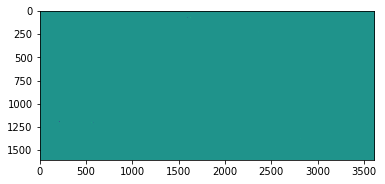

In [27]:
plt.imshow(imap)

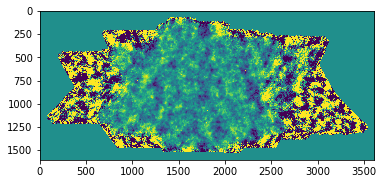

In [28]:
plt.imshow(imap,vmin=-300,vmax=300)

## Visualizing maps with ``pixell.enplot``

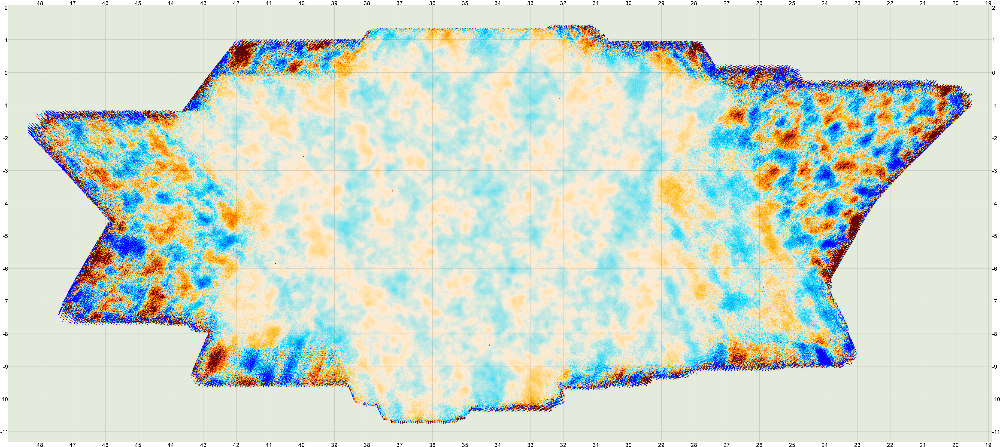

In [29]:
from pixell import enplot
plots = enplot.plot(imap,range=300,mask=0)
enplot.write("plots_example",plots)

def eshow(x,**kwargs): enplot.show(enplot.plot(x,**kwargs))
eshow(imap)

## Selecting regions of the map

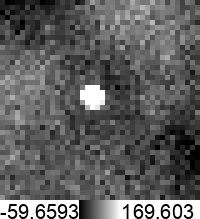

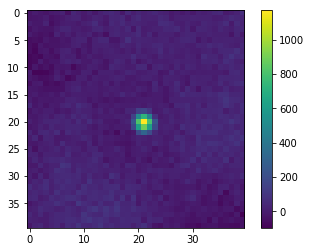

In [30]:
# [[decfrom,rafrom],[[decto,rato]]
dec,ra = np.deg2rad(np.array((-2.38,33.92)))
width = np.deg2rad(20./60.)
box = np.array([[dec-width/2.,ra-width/2.],[dec+width/2.,ra+width/2.]])
stamp = imap.submap(box)
plt.imshow(stamp)
plt.colorbar()

eshow(enmap.upgrade(stamp,5),grid=False, colorbar=True,color='gray')

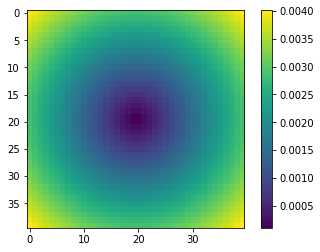

In [31]:
modrmap = stamp.modrmap()
plt.imshow(modrmap)
plt.colorbar()

In [32]:
radius = np.deg2rad(2./60.)
flux_in = stamp[modrmap<radius].mean()
flux_out = stamp[modrmap>=radius].mean()
print(flux_out,flux_in)

17.090459748246484 171.71338175166477


## Slicing and downgrading

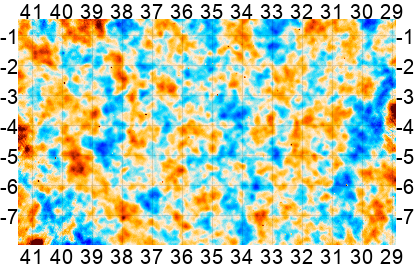

In [33]:
smap = enmap.downgrade(imap[400:-300,900:-1200],4)
eshow(smap,range=300)

## Apodizing

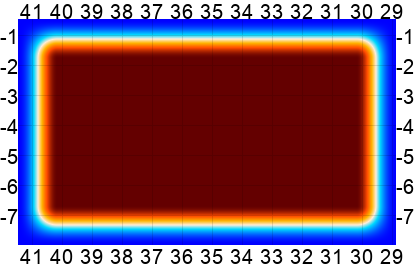

In [34]:
apod_pix=40
taper = enmap.apod(smap*0+1,apod_pix)
eshow(taper)

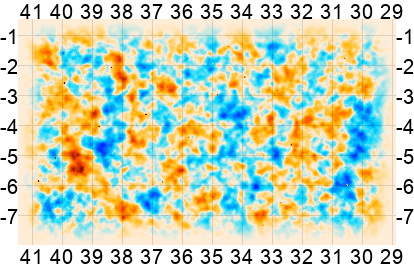

In [35]:
eshow(smap*taper,range=300)

## Fourier transforms and filtering

In [36]:
kmap = enmap.fft(smap*taper,normalize="phys")
print(kmap.shape)
print(kmap.wcs)
print(kmap.dtype)

(226, 378)
car:{cdelt:[-0.03333,0.03333],crval:[33.94,0],crpix:[226.9,239.9]}
complex128


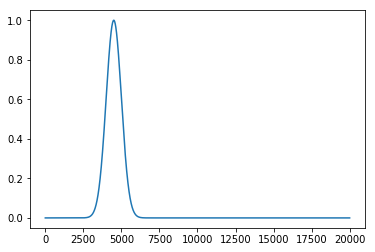

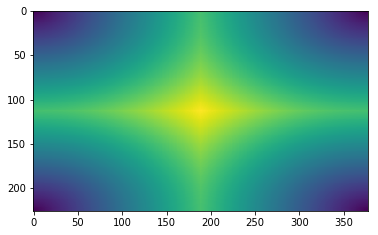

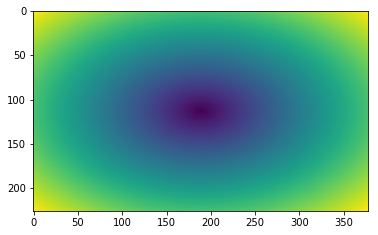

In [37]:
"""
A simple filter
"""

ells = np.arange(0,20000,1)
ell0 = 4500
ellsig = 500
fl = np.exp(-(ells-ell0)**2./2./ellsig**2.)

plt.plot(ells,fl)
plt.show()

modlmap = enmap.modlmap(smap.shape,smap.wcs)
modlmap = smap.modlmap()

plt.imshow(modlmap)
plt.show()
plt.imshow(np.fft.fftshift(modlmap))
plt.show()


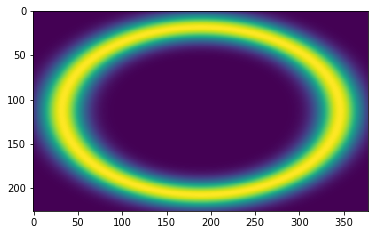

In [38]:
from scipy.interpolate import interp1d

fl2d = interp1d(ells,fl,bounds_error=False,fill_value=0)(modlmap)
plt.imshow(np.fft.fftshift(fl2d))

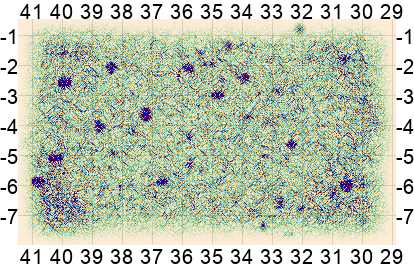

In [39]:
kfiltered = kmap*fl2d
filtered = enmap.ifft(kfiltered,normalize="phys").real

eshow(filtered)

## Fourier transforms and naive power spectra

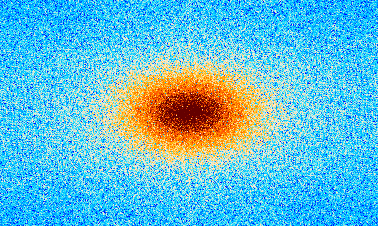

In [40]:
power = (kmap*np.conj(kmap)).real
shifted_power = enmap.samewcs(np.fft.fftshift(np.log10(power)),smap)
eshow(shifted_power,grid=False)

## Binned power spectrum

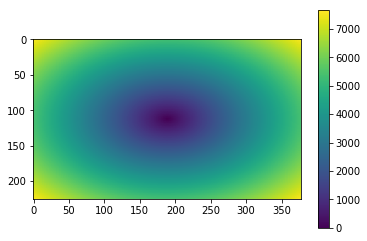

In [41]:
modlmap = smap.modlmap()
plt.imshow(np.fft.fftshift(modlmap))
plt.colorbar()

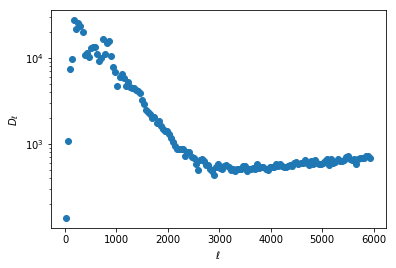

In [42]:
def bin(data,modlmap,bin_edges):
    digitized = np.digitize(np.ndarray.flatten(modlmap), bin_edges,right=True)
    return np.bincount(digitized,(data).reshape(-1))[1:-1]/np.bincount(digitized)[1:-1]

bin_edges = np.arange(0,6000,40)
centers = (bin_edges[1:] + bin_edges[:-1])/2.
w2 = np.mean(taper**2.)
binned_power = bin(power/w2,modlmap,bin_edges)

plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()

## Comparing with theory

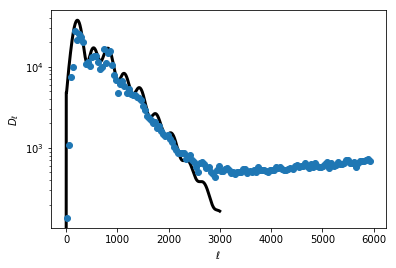

In [43]:
from pixell import powspec
camb_theory = powspec.read_spectrum("camb_theory.dat")
cltt = camb_theory[0,0,:3000]
ls = np.arange(cltt.size)

plt.plot(ls,cltt*ls**2.,lw=3,color='k')
plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()


## Reprojecting a healpix map

NOTE: This section onwards requires you to have a compiled version of pixell.

In [44]:
from pixell import reproject
pmap = reproject.enmap_from_healpix("planck_353.fits", smap.shape, smap.wcs, ncomp=1, unit=1, lmax=6000,rot="gal,equ")

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


/home/msyriac/.local/lib/python3.7/site-packages/healpy/fitsfunc.py:367: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))


Ordering converted to RING
Preparing SHT
T -> alm
float64 complex128
Computing pixel positions
Computing rotated positions
Projecting


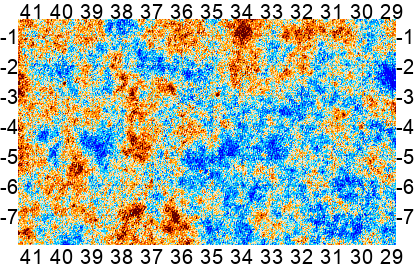

In [45]:
eshow(pmap)

## Cross-correlating Planck with ACT

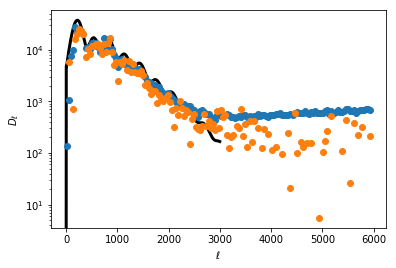

In [46]:
kmap2 = enmap.fft(pmap*taper*1e6,normalize="phys")
cross_power = (kmap*np.conj(kmap2)).real
binned_cross_power = bin(cross_power/w2,modlmap,bin_edges)

plt.plot(ls,cltt*ls**2.,lw=3,color='k')
plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.plot(centers,centers**2*binned_cross_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()

## Stacking

In [79]:
from astropy.io import fits
# Download the cluster catalog from https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_lensing/E-D56Clusters.fits
hdu = fits.open('E-D56Clusters.fits')
ras = hdu[1].data['RADeg']
decs = hdu[1].data['DECDeg']

# Write code to get stack